In [337]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tldextract
# from util import misc as misc_util # just copied the helpers here
cookies = pd.read_csv('Data/cookies.csv')
kid_domain_cookies = pd.read_csv('Data/page_data_with_categories_by_meta_title_text.csv')

In [338]:
reqs = pd.read_csv('data/requests.csv')

In [339]:
kid_pages = pd.read_csv('Data/KidPages_ver1.csv')

## Generalized Helper Functions

In [77]:
# Probaby it doesn't belong here
def show_dataframe(df, n_items):
    # Print
    print('\nCategory rows: %d' %df.shape[0])
    print('First few items: \n%s' %df.head(n_items))

# Return a subcategory
def get_category(df, category_id):
        return df[['start_url','category']][df['category'] == category_id]

# Some useful tools things.
def peek_categories(df, n_categories, n_items):

    for category in range(n_categories):
        show_dataframe(get_category(df, category), n_items)

# Getting domain from url
# Sometimes the domain is the 0th or 2nd position
def urlToDomain(urlValue):
    if len(urlValue)> 1:
        return tldextract.extract(urlValue).domain
    else:
        return urlValue


# Third party request
def isThirdParty(fromDomain, toDomain):
    return fromDomain != toDomain

## Count third party requests by domain
def countDomainwiseThirdParties(dataframe, normal=False):
    return dataframe[dataframe['third_party'] == True]['from'].value_counts(normalize=normal)

def countDomainwiseFirstParties(dataframe, normal=False):
    return dataframe[dataframe['third_party'] == False]['from'].value_counts(normalize=normal)

# Count third party from a DataFrame
# Return normalized values
def countThirdParties(dataframe, normal=True):
    return dataframe[dataframe['third_party'] == True]["to"].value_counts(normalize=normal)

# Returns a list of third parties
def countUniqueThirdParties(dataframe):
    return pd.unique(dataframe[['third_party', 'to']][dataframe['third_party'] == True]['to'])   

In [74]:
## Decluttering a dataframe to have just what we want
## Do several things to reduce dimensions of the dataset to make it more interesting
## to analyze

## Annette -  added an is_reqs boolean because the column name varies for cookies and requests
def tinyfy(is_reqs, dataframe, return_columns = []):
    
    # Create a from and to column
    dataframe['from'] = dataframe['start_url'].apply(urlToDomain)
    if(is_reqs == True):
        dataframe['to'] = dataframe['request_domain'].apply(urlToDomain)
    else:
        dataframe['to'] = dataframe['cookie_domain'].apply(urlToDomain)

    # Adding third party columns for requests
    dataframe['third_party'] = isThirdParty(dataframe['from'], dataframe['to'])
    if len(return_columns) == 0:
        return dataframe
    else:
        return dataframe[return_columns]

In [78]:
# Dropping duplicates
# This is just a wrapper
def dropDuplicates(dataframe):
    return dataframe.drop_duplicates()


# Filter dataset by categories
def filterByCategories(dataset):
    return (dataset[dataset['category'] == 0], dataset[dataset['category'] == 1], dataset[dataset['category'] == 2], dataset[dataset['category'] == 3])


# Count stuff into first and third party
def toFirstAndThird(dataset):
    # Ugly stuff
    dataset['first_third'] =dataset.groupby(by=['from', 'third_party'])['from'].transform('count')
    first_third = dataset[['from', 'third_party', 'first_third']]
    first_third.drop_duplicates(inplace=True)

    first = first_third[first_third['third_party'] == False][['from', 'first_third']]
    third = first_third[first_third['third_party'] == True][['from','first_third']]

    first.rename(columns={'first_third': 'First party'}, inplace=True)
    first = first.merge(third)
    first.rename(columns={'first_third': 'Third party'}, inplace=True)

    return first


In [232]:
#Annette - New helper functions
# Return list of page_ids corresponding to children websites
kid_page_ids = kid_pages['Index'].to_list()
kid_page_ids.sort()
# surveys_df[surveys_df['page_id'].isin([kid_page_ids])]
def filter_kids(df, isReqs):
    if(isReqs):
        return df[df['page_id'].isin(kid_page_ids)]
    else:
        return df[df['page_id'].isin(kid_page_ids)]

In [170]:
#Annette - new helper
#percent of total that have cookies or requests. both first and third parties
def percentTracking(total, df):
    num_first = countDomainwiseFirstParties(df).size
    num_third = countDomainwiseThirdParties(df).size
    percent_first = (num_first/total)*100
    percent_third = (num_third/total)*100
    return percent_first, percent_third

In [ ]:
return df.loc[df['title'].str.contains("kid|child"), ['page_id', 'start_url', 'request_domain']]

# Analysis

In [340]:
#tinyfy

#reqs
get_columns = ['page_id', 'from', 'to', 'third_party']
small_req = tinyfy(True,reqs, get_columns)

#cookies
small_cookie = tinyfy(False,cookies, get_columns)

In [341]:
#count third parties
print(countUniqueThirdParties(small_req).size)
print(countUniqueThirdParties(small_cookie).size)

6783
1197


In [84]:
# Dropping duplicates
# small_req = dropDuplicates(small_req)
# small_cookie = dropDuplicates(small_cookie)

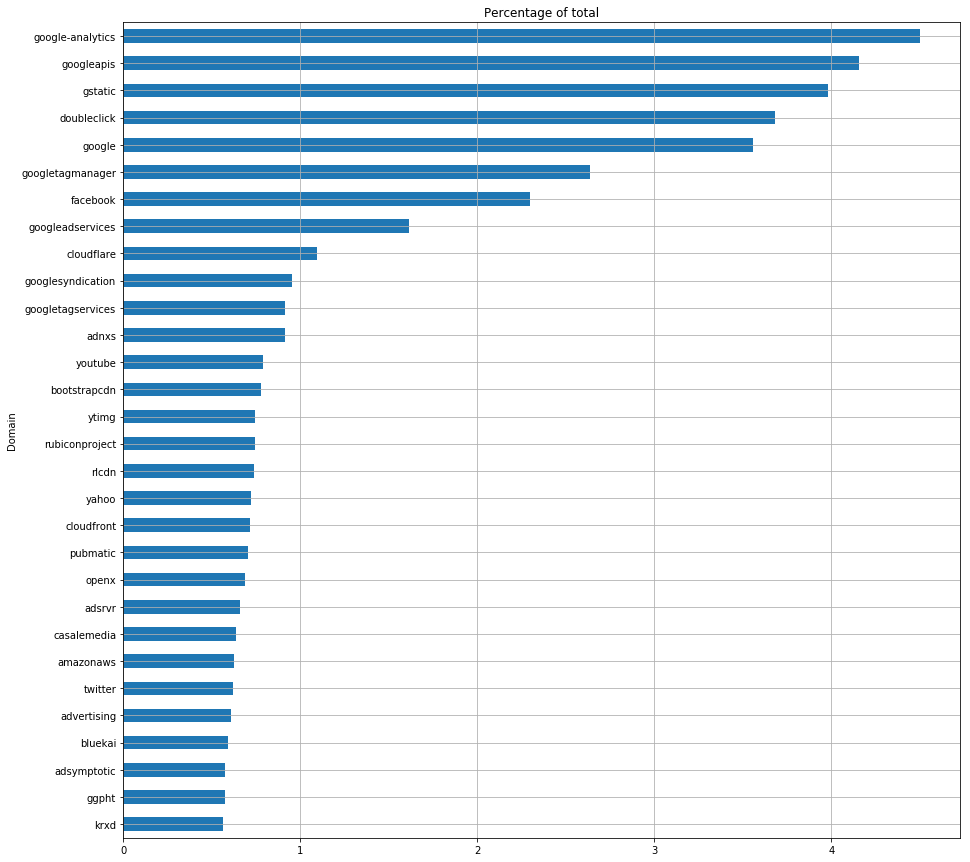

In [87]:
count_third_party_requests.sort_values(ascending=True).plot.barh(figsize=(15, 15), title='Percentage of total', xlabel='Domain', grid=True)

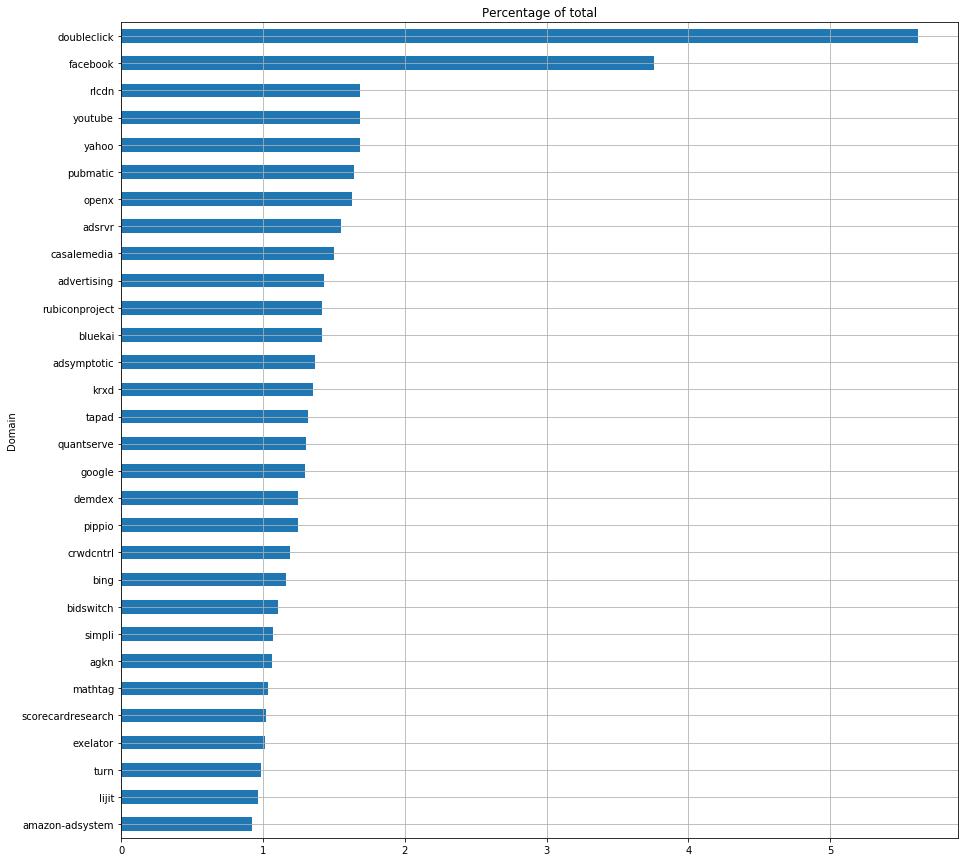

In [88]:
count_third_party_cookies.sort_values(ascending=True).plot.barh(figsize=(15, 15), title='Percentage of total', xlabel='Domain', grid=True)

# Include Kid Cookies/Reqs

In [342]:
kid_cookies= filter_kids(cookies, False)
kid_reqs = filter_kids(reqs, True)

In [343]:
print(len(kid_reqs['page_id'].unique()))

77


In [344]:
#make the dataframe for small_kid_cookie and small_kid_reqs
columns = ['page_id', 'from', 'to', 'third_party']
small_kid_cookie = tinyfy(False, kid_cookies, columns)
small_kid_reqs = tinyfy(True, kid_reqs, columns)
#need to drop duplicates here??
# small_kid_cookie = dropDuplicates(small_kid_cookie)
# small_kid_reqs = dropDuplicates(small_kid_reqs)

C:\Users\Annette\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Annette\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Users\Annette\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

In [345]:
total_orig = 10000
total_kid = len(kid_pages)
orig_cookies_first, orig_cookies_third = percentTracking(total_orig, small_cookie)
kid_cookies_first, kid_cookies_third = percentTracking(total_kid, small_kid_cookie)
orig_reqs_first, orig_reqs_third = percentTracking(total_orig, small_req)
kid_reqs_first, kid_reqs_third = percentTracking(total_kid, small_kid_reqs)

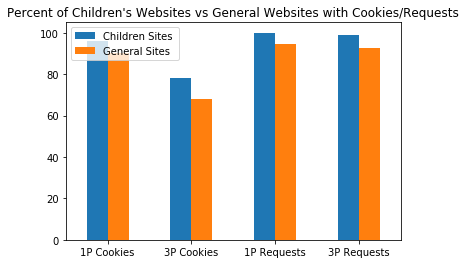

In [346]:
kid = [kid_cookies_first, kid_cookies_third, kid_reqs_first, kid_reqs_third]
orig = [orig_cookies_first, orig_cookies_third, orig_reqs_first, orig_reqs_third]
index = ['1P Cookies', '3P Cookies', '1P Requests', '3P Requests']
df = pd.DataFrame({'Children Sites ': kid,
                   'General Sites': orig}, index=index)
ax = df.plot.bar(rot=0, title = "Percent of Children's Websites vs General Websites with Cookies/Requests")

In [381]:
#value counts for the websites that have third parties
count_third_party_requests = countDomainwiseThirdParties(small_req) 
count_third_party_cookies = countDomainwiseThirdParties(small_cookie) 
count_third_party_requests_kid = countDomainwiseThirdParties(small_kid_reqs) 
count_third_party_cookies_kid = countDomainwiseThirdParties(small_kid_cookie)

#including 1st party now -- didnt make a difference in the graphs
count_requests = small_req[small_req['third_party'] == True]["from"].value_counts()
count_cookies = small_cookie[small_cookie['third_party'] == True]["from"].value_counts()
count_requests_kid = small_kid_reqs[small_kid_reqs['third_party'] == True]["from"].value_counts()
count_cookies_kid = small_kid_cookie[small_kid_cookie['third_party'] == True]["from"].value_counts()

# Top 10 domains
r_top10 = countThirdParties(small_req).sort_values(ascending=False)[:10]
c_top10 = countThirdParties(small_cookie).sort_values(ascending=False)[:10]
r_top10_kid = countThirdParties(small_kid_reqs).sort_values(ascending=False)[:10]
c_top10_kid = countThirdParties(small_kid_cookie).sort_values(ascending=False)[:10]

In [376]:
count_cookies.describe()
len(count_cookies)

9015

In [354]:
# Comparing most prevalent third parties 
from pandas import DataFrame
# print(third_party_count)
Data = {'Top Cookies- Normal': c_top10.index,
        'Top Cookies- Kid': c_top10_kid.index,
        'Top Requests- Normal': r_top10.index,
        'Top Requests- Kid': r_top10_kid.index
       }

df = DataFrame(Data,columns=['Top Cookies- Normal','Top Cookies- Kid', 'Top Requests- Normal', 'Top Requests- Kid'])
# df.plot(x ='Top Third Parties', y='Top Third Parties: Kids', kind = 'bar')
from IPython.display import HTML
HTML(df.to_html(index=False))

Top Cookies- Normal,Top Cookies- Kid,Top Requests- Normal,Top Requests- Kid
pubmatic,pubmatic,doubleclick,doubleclick
casalemedia,lijit,gstatic,googlesyndication
lijit,addthis,googlesyndication,gstatic
doubleclick,casalemedia,facebook,shopify
yahoo,yahoo,googleapis,facebook
addthis,doubleclick,shopify,pubmatic
rubiconproject,pippio,google-analytics,googleapis
pippio,intentiq,google,google-analytics
crwdcntrl,owneriq,pubmatic,google
tapad,crwdcntrl,youtube,gumgum


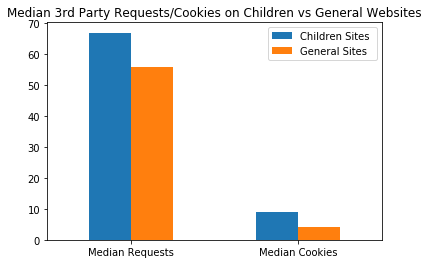

In [384]:
#1st + 3rd party
kid = [count_requests_kid.median(), count_cookies_kid.median()]
orig = [count_requests.median(), count_cookies.median()]
index = ['Median Requests', 'Median Cookies']
df = pd.DataFrame({'Children Sites ': kid,
                   'General Sites': orig}, index=index)
ax = df.plot.bar(rot=0, title = "Median 3rd Party Requests/Cookies on Children vs General Websites")

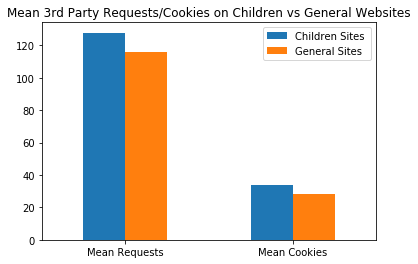

In [385]:
#1st + 3rd party - MEAN
kid = [count_requests_kid.mean(), count_cookies_kid.mean()]
orig = [count_requests.mean(), count_cookies.mean()]
index = ['Mean Requests', 'Mean Cookies']
df = pd.DataFrame({'Children Sites ': kid,
                   'General Sites': orig}, index=index)
ax = df.plot.bar(rot=0, title = "Mean 3rd Party Requests/Cookies on Children vs General Websites")

In [325]:
small_cookie.value_counts()

page_id  from                                           to                                             third_party
9967     rahvaraamat                                    zopim                                          True           1
3445     marilynandsarah                                crwdcntrl                                      True           1
3442     essentials                                     essentials                                     False          1
                                                        facebook                                       True           1
                                                        onthe                                          True           1
                                                        scorecardresearch                              True           1
                                                        taboola                                        True           1
3443     clintoncardinals                    

In [336]:
x = small_cookie['from'].value_counts().sum()
y = len(small_cookie['from'].value_counts())
x//y
small_cookie['from'].value_counts().describe()

count    9101.000000
mean        9.808263
std        76.192051
min         1.000000
25%         1.000000
50%         3.000000
75%         6.000000
max      6987.000000
Name: from, dtype: float64

In [327]:
cookies.value_counts()

KeyboardInterrupt: 

In [ ]:
small_kid_cookie.value_counts()